# Домашнее задание. Обучение языковой модели с помощью LSTM (10 баллов)

Это домашнее задание проходит в формате peer-review. Это означает, что его будут проверять ваши однокурсники. Поэтому пишите разборчивый код, добавляйте комментарии и пишите выводы после проделанной работы. 

В этом задании Вам предстоит обучить языковую модель с помощью рекуррентной нейронной сети. В отличие от семинарского занятия, Вам необходимо будет работать с отдельными словами, а не буквами.


Установим модуль ```datasets```, чтобы нам проще было работать с данными.

In [1]:
!pip install datasets

Импорт необходимых библиотек

In [3]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

import numpy as np
import matplotlib.pyplot as plt

from tqdm.auto import tqdm
from datasets import load_dataset
from nltk.tokenize import sent_tokenize, word_tokenize
from sklearn.model_selection import train_test_split
import nltk

from collections import Counter
from typing import List

import seaborn
import string
import pandas as pd
seaborn.set(palette='summer')

In [3]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/anna/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

## Подготовка данных

Воспользуемся датасетом imdb. В нем хранятся отзывы о фильмах с сайта imdb. Загрузим данные с помощью функции ```load_dataset```

In [5]:
# Загрузим датасет
dataset = load_dataset('imdb')

Found cached dataset imdb (/home/anna/.cache/huggingface/datasets/imdb/plain_text/1.0.0/d613c88cf8fa3bab83b4ded3713f1f74830d1100e171db75bbddb80b3345c9c0)


  0%|          | 0/3 [00:00<?, ?it/s]

### Препроцессинг данных и создание словаря (1 балл)

Далее вам необходмо самостоятельно произвести препроцессинг данных и получить словарь или же просто ```set``` строк. Что необходимо сделать: 

1. Разделить отдельные тренировочные примеры на отдельные предложения с помощью функции ```sent_tokenize``` из бибилиотеки ```nltk```. Каждое отдельное предложение будет одним тренировочным примером. 
2. Оставить только те предложения, в которых меньше ```word_threshold``` слов.
3. Посчитать частоту вхождения каждого слова в оставшихся предложениях. Для деления предлоения на отдельные слова удобно использовать функцию ```word_tokenize```. 
4. Создать объект ```vocab``` класса ```set```, положить в него служебные токены '\<unk\>', '\<bos\>', '\<eos\>', '\<pad\>' и vocab_size самых частовстречающихся слов.   

In [6]:
data_set = [el.replace('br />', '') for el in dataset['train']['text']]

In [7]:
len(data_set)

25000

In [8]:
sentences = []
word_threshold = 32
# Получить отдельные предложения и поместить их в sentences
for sentence in tqdm(data_set):
    sentences.extend(
        [x.lower() for x in sent_tokenize(sentence, language='english') if len([w for w in word_tokenize(x) if w not in string.punctuation]) < word_threshold]
        )

print(sentences)

  0%|          | 0/25000 [00:00<?, ?it/s]

['i rented i am curious-yellow from my video store because of all the controversy that surrounded it when it was first released in 1967.', "really, the sex and nudity scenes are few and far between, even then it's not shot like some cheaply made porno.", 'while my countrymen mind find it shocking, in reality sex and nudity are a major staple in swedish cinema.', 'i am curious-yellow is a good film for anyone wanting to study the meat and potatoes (no pun intended) of swedish cinema.', "but really, this film doesn't have much of a plot.", '"i am curious: yellow" is a risible and pretentious steaming pile.', "it doesn't matter what one's political views are because this film can hardly be taken seriously on any level.", "as for the claim that frontal male nudity is an automatic nc-17, that isn't true.", "i've seen r-rated films with male nudity.", 'granted, they only offer some fleeting views, but where are the r-rated films with gaping vulvas and flapping labia?', "nowhere, because they

In [9]:
print("Всего предложений:", len(sentences))

Всего предложений: 217385


In [10]:
#посмотрим есть ли смысл преобразовывать лист в сет чтобы убрать дубликаты
print("Всего предложений:", len(set(sentences)))


Всего предложений: 210424


In [11]:
#видно что в датасете почти 7 000 повторяющихся слов по этому перезапишем sentences
sentences = list(set(sentences))

Посчитаем для каждого слова его встречаемость.

In [12]:
words = Counter()

# Расчет встречаемости слов

for sentence in tqdm(sentences):
    for word in word_tokenize(sentence):
        if word not in string.punctuation:
            words[word] += 1

  0%|          | 0/210424 [00:00<?, ?it/s]

Добавим в словарь ```vocab_size``` самых встречающихся слов.

In [13]:
print(len(words))

76839


In [14]:
#в нашем наборе данных получилось около 59 тысяч слов уменьшим до 40000
vocab_size = 40000

# Наполнение словаря
vocab = set(['<unk>', '<bos>', '<eos>', '<pad>'] + [word for word,count in sorted(words.items(), key=lambda x:-x[1])[:vocab_size]])


In [15]:
assert '<unk>' in vocab
assert '<bos>' in vocab 
assert '<eos>' in vocab 
assert '<pad>' in vocab
assert len(vocab) == vocab_size + 4

In [16]:
print("Всего слов в словаре:", len(vocab))

Всего слов в словаре: 40004


### Подготовка датасета (1 балл)

Далее, как и в семинарском занятии, подготовим датасеты и даталоадеры.

В классе ```WordDataset``` вам необходимо реализовать метод ```__getitem__```, который будет возвращать сэмпл данных по входному idx, то есть список целых чисел (индексов слов). 

Внутри этого метода необходимо добавить служебные токены начала и конца последовательности, а также токенизировать соответствующее предложение с помощью ```word_tokenize``` и сопоставить ему индексы из ```word2ind```. 

In [17]:
word2ind = {word: i for i, word in enumerate(vocab)}
ind2word = {i: word for word, i in word2ind.items()}

In [18]:
class WordDataset:
    def __init__(self, sentences):
        self.data = sentences
        self.unk_id = word2ind['<unk>']
        self.bos_id = word2ind['<bos>']
        self.eos_id = word2ind['<eos>']
        self.pad_id = word2ind['<pad>']

    def __getitem__(self, idx: int) -> List[int]:
        tokenized_sentence = []
        # Допишите код здесь
        tokenized_sentence = [self.bos_id]
        tokenized_sentence += [word2ind.get(word, self.unk_id) for word in word_tokenize((self.data[idx]).lower(), language='english')] 
        tokenized_sentence += [self.eos_id]

        return tokenized_sentence

    def __len__(self) -> int:
        return len(self.data)

In [19]:
def collate_fn_with_padding(
    input_batch: List[List[int]], pad_id=word2ind['<pad>']) -> torch.Tensor:
    seq_lens = [len(x) for x in input_batch]
    max_seq_len = max(seq_lens)

    new_batch = []
    for sequence in input_batch:
        for _ in range(max_seq_len - len(sequence)):
            sequence.append(pad_id)
        new_batch.append(sequence)
    
    sequences = torch.LongTensor(new_batch).to(device)

    new_batch = {
        'input_ids': sequences[:,:-1],
        'target_ids': sequences[:,1:]
    }

    return new_batch

In [20]:
sentences = list(sentences)
train_sentences, eval_t_sentences = train_test_split(sentences, test_size=0.2)
eval_sentences, test_sentences = train_test_split(eval_t_sentences, test_size=0.5)

train_dataset = WordDataset(train_sentences)
eval_dataset = WordDataset(eval_sentences)
test_dataset = WordDataset(test_sentences)

batch_size = 64

train_dataloader = DataLoader(
    train_dataset, collate_fn=collate_fn_with_padding, batch_size=batch_size)

eval_dataloader = DataLoader(
    eval_dataset, collate_fn=collate_fn_with_padding, batch_size=batch_size)

test_dataloader = DataLoader(
    test_dataset, collate_fn=collate_fn_with_padding, batch_size=batch_size)

## Обучение и архитектура модели

Вам необходимо на практике проверить, что влияет на качество языковых моделей. В этом задании нужно провести серию экспериментов с различными вариантами языковых моделей и сравнить различия в конечной перплексии на тестовом множестве. 

Возмоэные идеи для экспериментов:

* Различные RNN-блоки, например, LSTM или GRU. Также можно добавить сразу несколько RNN блоков друг над другом с помощью аргумента num_layers. Вам поможет официальная документация [здесь](https://pytorch.org/docs/stable/generated/torch.nn.LSTM.html)
* Различные размеры скрытого состояния. Различное количество линейных слоев после RNN-блока. Различные функции активации. 
* Добавление нормализаций в виде Dropout, BatchNorm или LayerNorm
* Различные аргументы для оптимизации, например, подбор оптимального learning rate или тип алгоритма оптимизации SGD, Adam, RMSProp и другие
* Любые другие идеи и подходы

После проведения экспериментов необходимо составить таблицу результатов, в которой описан каждый эксперимент и посчитана перплексия на тестовом множестве. 

Учтите, что эксперименты, которые различаются, например, только размером скрытого состояния или количеством линейных слоев считаются, как один эксперимент.

Успехов!

### Функция evaluate (1 балл)

Заполните функцию ```evaluate```

In [21]:
def evaluate(model, criterion, dataloader) -> float:
    model.eval()
    perplexity, losses = [], []
    with torch.no_grad():
        for batch in dataloader:
            logits = model(batch['input_ids']).flatten(start_dim=0, end_dim=1) # Посчитайте логиты предсказаний следующих слов
            loss = criterion(logits, batch['target_ids'].flatten())
            perplexity.append(torch.exp(loss).item())
            losses.append(loss)
    
    perplexity = sum(perplexity) / len(perplexity)
    l = sum(losses)/len(losses)

    return perplexity, l

### Первый эксперимент (2 балла)

Определите архитектуру модели и обучите её. 

In [22]:
class LanguageModel(nn.Module):
        
    def __init__(self, hidden_dim: int, vocab_size: int,  activ_type = nn.Tanh(), num_layer: int = 1, drop: float = 0.1):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, hidden_dim)
        self.rnn = nn.RNN(hidden_dim, hidden_dim, batch_first=True, num_layers = num_layer)
        self.linear = nn.Linear(hidden_dim, hidden_dim)
        self.projection = nn.Linear(hidden_dim, vocab_size)

        self.non_lin = activ_type
        self.dropout = nn.Dropout(p=drop)

    def forward(self, input_batch) -> torch.Tensor:
        embeddings = self.embedding(input_batch)  # [batch_size, seq_len, hidden_dim]
        output, _ = self.rnn(embeddings)  # [batch_size, seq_len, hidden_dim]

        output = self.dropout(self.linear(self.non_lin(output)))  # [batch_size, seq_len, hidden_dim]
        projection = self.projection(self.non_lin(output))  # [batch_size, seq_len, vocab_size]

        return projection

In [23]:
class LanguageModelGRU(nn.Module):
        
    def __init__(self, hidden_dim: int, vocab_size: int,  activ_type = nn.Tanh(), num_layer: int = 1, drop: float = 0.1):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, hidden_dim)
        self.rnn = nn.GRU(hidden_dim, hidden_dim, batch_first=True, num_layers = num_layer)
        self.linear = nn.Linear(hidden_dim, hidden_dim)
        self.projection = nn.Linear(hidden_dim, vocab_size)

        self.non_lin = activ_type
        self.dropout = nn.Dropout(p=drop)

    def forward(self, input_batch) -> torch.Tensor:
        embeddings = self.embedding(input_batch)  # [batch_size, seq_len, hidden_dim]
        output, _ = self.rnn(embeddings)  # [batch_size, seq_len, hidden_dim]

        output = self.dropout(self.linear(self.non_lin(output))) # [batch_size, seq_len, hidden_dim]
        projection = self.projection(self.non_lin(output))  # [batch_size, seq_len, vocab_size]

        return projection

In [24]:
class LanguageModelLSTM(nn.Module):
        
    def __init__(self, hidden_dim: int, vocab_size: int,  activ_type = nn.Tanh(), num_layer: int = 1, drop: float = 0.1):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, hidden_dim)
        self.rnn = nn.LSTM(hidden_dim, hidden_dim, batch_first=True, num_layers = num_layer)
        self.linear = nn.Linear(hidden_dim, hidden_dim)
        self.projection = nn.Linear(hidden_dim, vocab_size)
        self.batchnorm = nn.BatchNorm2d()
        self.non_lin = activ_type
        self.dropout = nn.Dropout(p=drop)

    def forward(self, input_batch) -> torch.Tensor:
        embeddings = self.embedding(input_batch)  # [batch_size, seq_len, hidden_dim]
        output, _ = self.rnn(embeddings)  # [batch_size, seq_len, hidden_dim]
        output = self.dropout(self.linear(self.non_lin(output)))  # [batch_size, seq_len, hidden_dim]
        output = self.dropout(self.linear(self.non_lin(output)))  # [batch_size, seq_len, hidden_dim]
        projection = self.projection(self.non_lin(output))  # [batch_size, seq_len, vocab_size]

        return projection

### Train loop (1 балл)

Напишите функцию для обучения модели. 

In [4]:
def train_model(type:str, data_loader, num_epoch, n_layers = 1, hid_dim = 256, dropout = 0.1, nelin = nn.Tanh()):
    early_break = 0
    torch.manual_seed(200)
    torch.cuda.manual_seed(200)

    eval_steps = len(train_dataloader)

    print(f"Starting training for {type}_{n_layers}layers_{num_epoch}epohs_nelin_{nelin}_dropout{dropout}")
    if type == 'GRU':
        print('GRU')
        model = LanguageModel(hidden_dim=hid_dim, vocab_size=len(vocab), activ_type = nelin, num_layer= n_layers, drop = dropout ).to(device)
    elif type == 'LSTM':
        print('LSTM')
        model = LanguageModelLSTM(hidden_dim=hid_dim, vocab_size=len(vocab), activ_type = nelin, num_layer= n_layers, drop = dropout ).to(device)
    else:
        print('Type of model is RNN')
        model = LanguageModel(hidden_dim=hid_dim, vocab_size=len(vocab), activ_type = nelin, num_layer= n_layers, drop = dropout ).to(device)
    losses, loss_eval = [], []
    perplexities = []

    model = model.to(device)
    criterion = nn.CrossEntropyLoss(ignore_index =  word2ind['<pad>'])
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    for epoch in tqdm(range(num_epoch)):
        epoch_losses = []
        model.train()
        for i, batch in enumerate(data_loader):
            optimizer.zero_grad()
            logits = model(batch['input_ids']).flatten(start_dim=0, end_dim=1)
            loss = criterion(logits, batch['target_ids'].flatten())
            loss.backward()
            optimizer.step()

            epoch_losses.append(loss.item())
            if i % eval_steps == 0:
                perp, ev_loss = evaluate(model, criterion, eval_dataloader)
                if len(perplexities) !=0 and perp > perplexities[-1]:
                    early_break += 1
                perplexities.append(perp), loss_eval.append(float(ev_loss))
                #print(f'loss {ev_loss:3f} perpl {perp: .3f}')
                model.train()
            if early_break == 2:
                # если 2 эпохи подряд значение перплексии становится хуже, автоматически прервется цикл обучения
                # визуализация процесса обучения
                print(f'early break at {epoch}')
                plt.figure(figsize = (15, 5))
                plt.subplot(121)
                plt.plot(np.arange(len(losses)), losses)
                plt.plot(np.arange(len(loss_eval)), loss_eval, c = 'blue')
                plt.legend(['Train loss', 'Val loss'])
                plt.title('Losses')
                plt.xlabel("epoch")
                plt.subplot(122)
                plt.plot(np.arange(len(perplexities[1:])), perplexities[1:], )
                print(f"Лучшая перплексия для подхода 'GRU_{n_layers}layers_{num_epoch}epohs_nelin_{nelin}_dropout{dropout}: {(min(perplexities)):.3f}")
                plt.title('Перплексия')
                plt.legend(['Val perplexity'])
                plt.xlabel("epoch")
                plt.show();
                model.eval()
                return [f'{type}_{n_layers}layers_{num_epoch}epohs_nelin_{nelin}_dropout{dropout}_hiddim_{hid_dim}', losses, loss_eval, perplexities, min(perplexities), evaluate(model, criterion, test_dataloader)], model
        
        losses.append(sum(epoch_losses) / len(epoch_losses))
    
    # визуализация процесса обучения
    plt.figure(figsize = (15, 5))
    plt.subplot(121)
    plt.plot(np.arange(len(losses)), losses)
    plt.plot(np.arange(len(loss_eval)), loss_eval, c = 'blue')
    plt.legend(['Train loss', 'Val loss'])
    plt.title('Losses')
    plt.xlabel("epoch")
    plt.subplot(122)
    plt.plot(np.arange(len(perplexities[1:])), perplexities[1:], )
    print(f"Лучшая перплексия для подхода 'GRU_{n_layers}layers_{num_epoch}epohs_nelin_{nelin}_dropout{dropout}: {(min(perplexities)):.3f}")
    plt.title('Перплексия')
    plt.legend(['Val perplexity'])
    plt.xlabel("epoch")
    plt.show();
    model.eval()
    return [f'{type}_{n_layers}layers_{num_epoch}epohs_nelin_{nelin}_dropout{dropout}_hiddim_{hid_dim}', losses, loss_eval, perplexities, min(perplexities), evaluate(model, criterion, test_dataloader)], model

In [28]:
#создам табличку для сохранения результатов
my_results_df = pd.DataFrame(columns=['Model_params', 'loss', 'loss_eval', 'perplexity', 'min_perplexoty', 'test_perpl'])
my_results_df

,Model_params,loss,loss_eval,perplexity,min_perplexoty,test_perpl


Starting training for GRU_1layers_5epohs_nelin_Tanh()_dropout0.1
GRU


  0%|          | 0/5 [00:00<?, ?it/s]

Лучшая перплексия для подхода 'GRU_1layers_5epohs_nelin_Tanh()_dropout0.1: 159.968


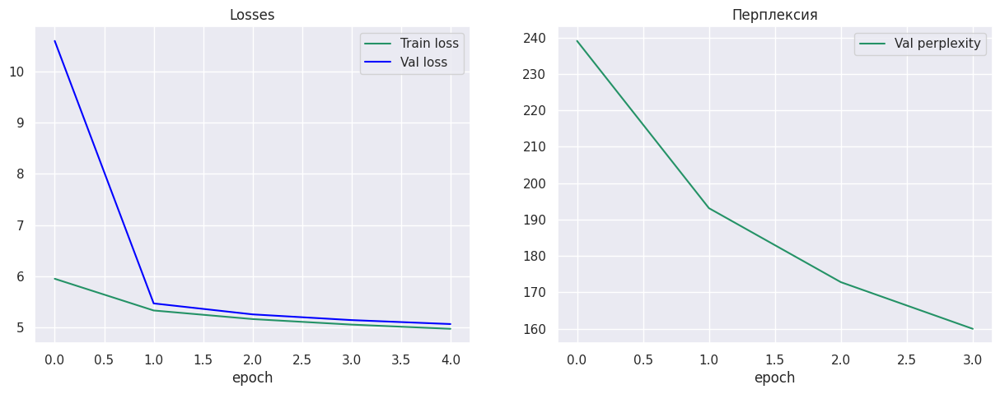

In [34]:
#first I will start with 1 layer of GRU with 5 epochs
my_results_df.loc[len(my_results_df)],my_model = train_model('GRU', train_dataloader, 5)

Starting training for GRU_1layers_20epohs_nelin_Tanh()_dropout0.1
GRU


  0%|          | 0/20 [00:00<?, ?it/s]

Лучшая перплексия для подхода 'GRU_1layers_20epohs_nelin_Tanh()_dropout0.1: 116.062


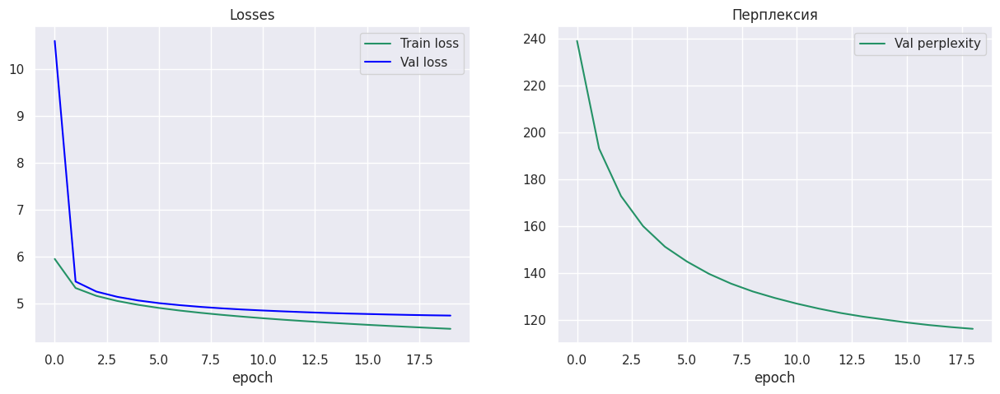

In [36]:
#попробуем с 20 эпохами
my_results_df.loc[len(my_results_df)],my_model = train_model('GRU', train_dataloader, 20)

### Второй эксперимент (2 балла)

Попробуйте что-то поменять в модели или в пайплайне обучения, идеи для экспериментов можно подсмотреть выше. 

Starting training for GRU_2layers_20epohs_nelin_Tanh()_dropout0.1
GRU


  0%|          | 0/20 [00:00<?, ?it/s]

Лучшая перплексия для подхода 'GRU_2layers_20epohs_nelin_Tanh()_dropout0.1: 115.586


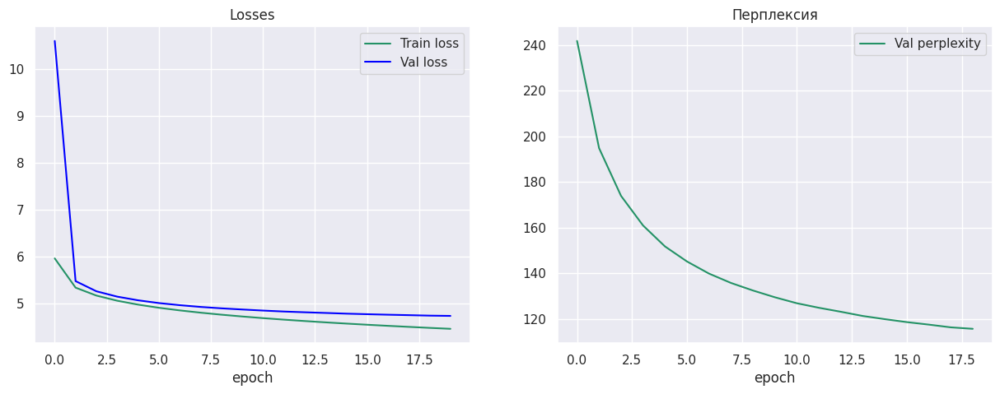

Starting training for GRU_2layers_20epohs_nelin_Tanh()_dropout0.1
GRU


  0%|          | 0/20 [00:00<?, ?it/s]

Лучшая перплексия для подхода 'GRU_2layers_20epohs_nelin_Tanh()_dropout0.1: 105.839


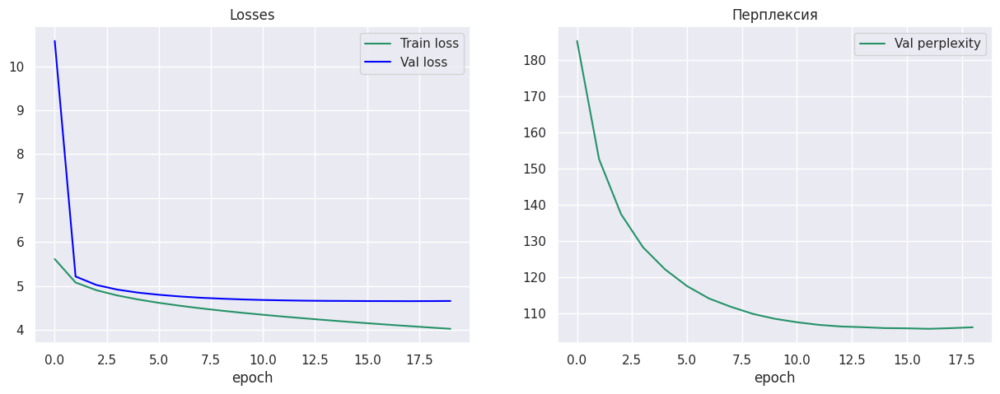

Starting training for GRU_2layers_20epohs_nelin_Tanh()_dropout0.1
GRU


  0%|          | 0/20 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 1.43 GiB (GPU 0; 11.76 GiB total capacity; 7.88 GiB already allocated; 1.33 GiB free; 9.43 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [39]:
#попробуем с 2 слоями
my_results_df.loc[len(my_results_df)], gru_model1 = train_model('GRU', train_dataloader, num_epoch= 20, n_layers=2)

#2 слоя ГРУ и в два раза увеличим размер скрытого состояния
my_results_df.loc[len(my_results_df)], gru_model2 = train_model('GRU', train_dataloader, num_epoch= 20, n_layers=2, hid_dim=512)


# с этой архитектурой все упало, перезапустила ниже еще раз
my_results_df.loc[len(my_results_df)], gru_model3 = train_model('GRU', train_dataloader, num_epoch= 20, n_layers=2, hid_dim=1024, dropout = 0.1)




Starting training for GRU_2layers_10epohs_nelin_Tanh()_dropout0.1
GRU


  0%|          | 0/10 [00:00<?, ?it/s]

Лучшая перплексия для подхода 'GRU_2layers_10epohs_nelin_Tanh()_dropout0.1: 104.448


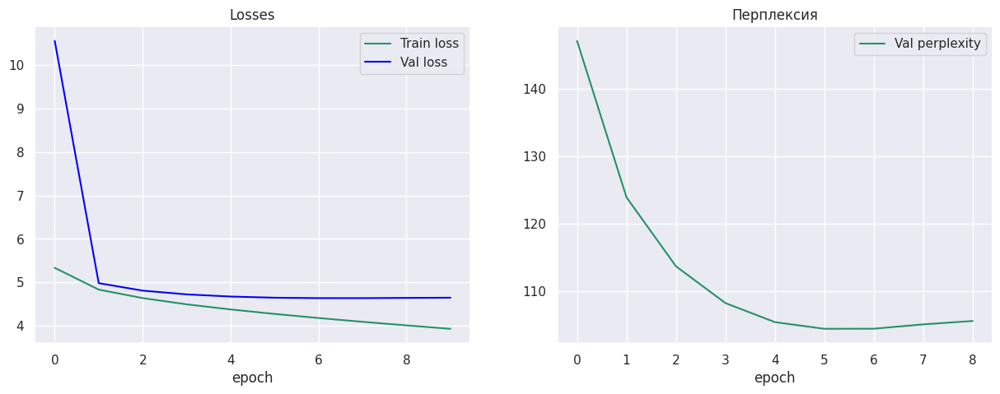

In [56]:
#ГРУ с 2 слоями и еще в два раза увеличиваю размер скрытого состояния
my_results_df.loc[len(my_results_df)], gru_model3 = train_model('GRU', train_dataloader, num_epoch= 10, n_layers=2, hid_dim=1024, dropout = 0.1)
torch.cuda.empty_cache()

In [50]:
my_results_df.to_csv('my_results_df.csv')

Starting training for GRU_2layers_7epohs_nelin_Tanh()_dropout0.0
GRU


  0%|          | 0/7 [00:00<?, ?it/s]

Лучшая перплексия для подхода 'GRU_2layers_7epohs_nelin_Tanh()_dropout0.0: 99.626


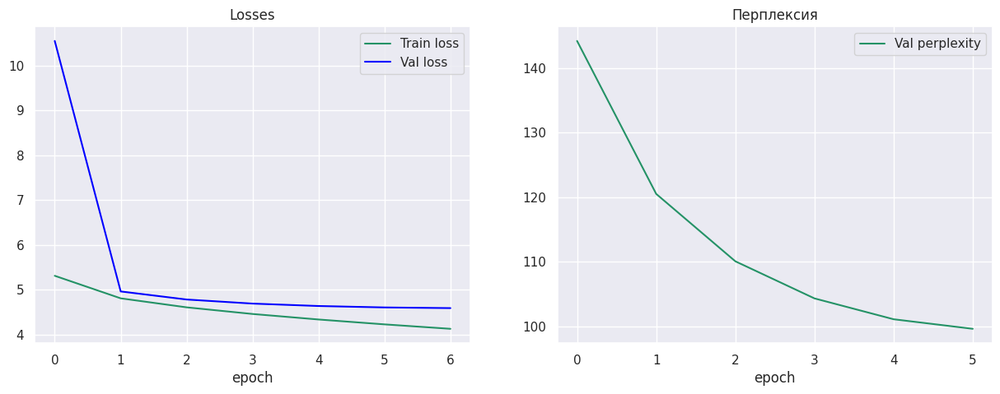

In [57]:
#теперь с той же архитектурой попробуем изменить значение дропаута снизив его до нуля
my_results_df.loc[len(my_results_df)], gru_model4 = train_model('GRU', train_dataloader, num_epoch= 7, n_layers=2, hid_dim=1024, dropout = 0.0)
my_results_df.to_csv('my_results_df.csv')
torch.cuda.empty_cache()

Starting training for GRU_2layers_7epohs_nelin_Tanh()_dropout0.2
GRU


  0%|          | 0/7 [00:00<?, ?it/s]

Лучшая перплексия для подхода 'GRU_2layers_7epohs_nelin_Tanh()_dropout0.2: 118.217


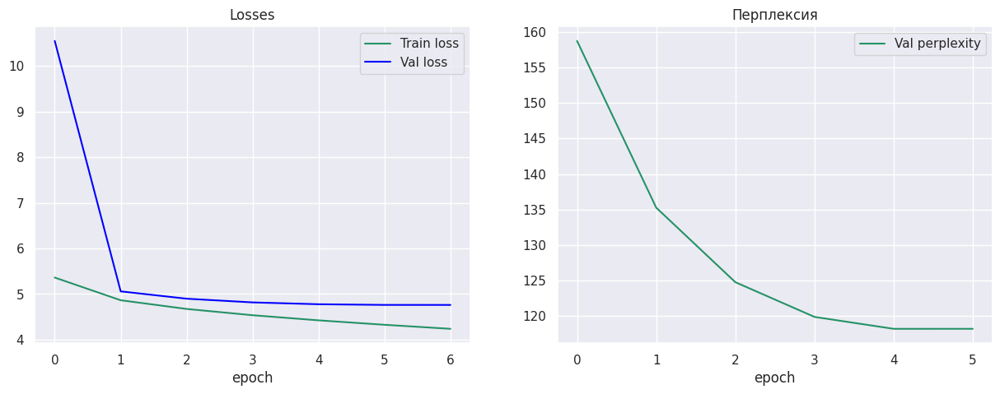

In [58]:
#теперь увеличим дропаут до 0,2
my_results_df.loc[len(my_results_df)], gru_model5 = train_model('GRU', train_dataloader, num_epoch= 7, n_layers=2, hid_dim=1024, dropout = 0.2)
my_results_df.to_csv('my_results_df.csv')
torch.cuda.empty_cache()

Starting training for GRU_3layers_10epohs_nelin_Tanh()_dropout0.1
GRU


  0%|          | 0/10 [00:00<?, ?it/s]

Лучшая перплексия для подхода 'GRU_3layers_10epohs_nelin_Tanh()_dropout0.1: 136.045


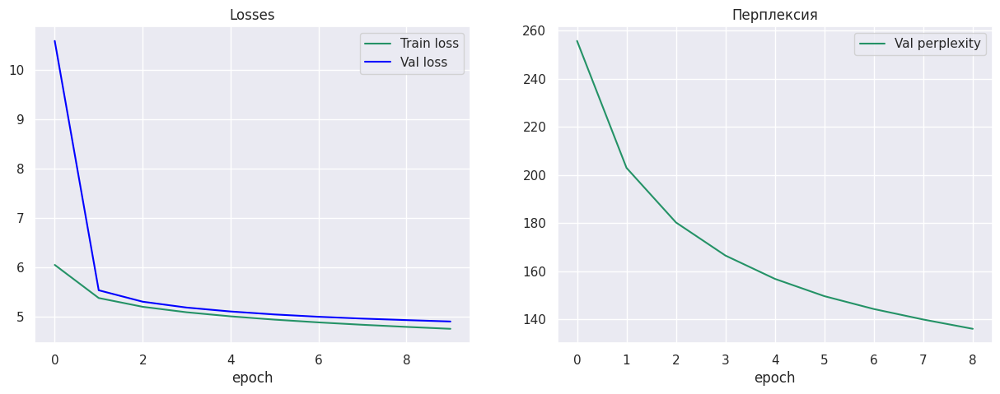

In [59]:
#теперь попробуем с 3 слоями
my_results_df.loc[len(my_results_df)], gru_model6 = train_model('GRU', train_dataloader, num_epoch= 10, n_layers=3, hid_dim=256, dropout = 0.1)
my_results_df.to_csv('my_results_df.csv')
torch.cuda.empty_cache()

In [61]:
my_results_df.to_csv('my_results_df.csv')

Starting training for LSTM_1layers_20epohs_nelin_Tanh()_dropout0.1
LSTM
Лучшая перплексия для подхода LSTM_1layers_20epohs_nelin_Tanh()_dropout0.1: 136.045


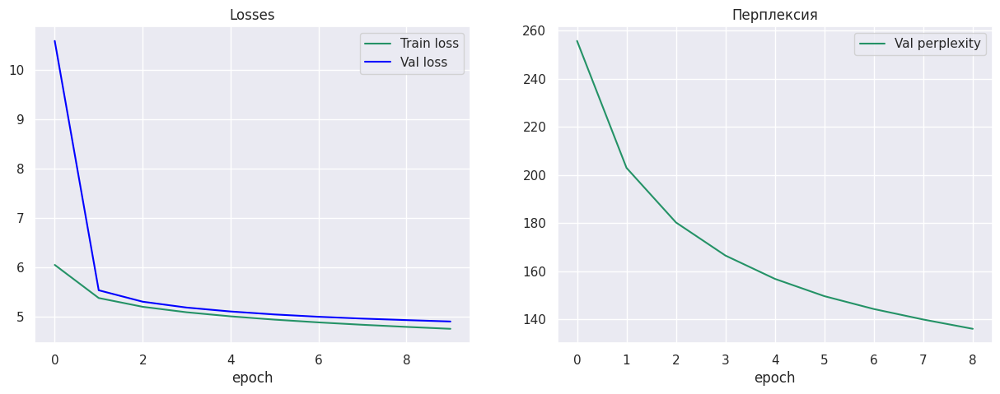

In [47]:
#ЛСТМ
# один слой ЛСТМ скрытый слой 256, дропаут 0.1
my_results_df.loc[len(my_results_df)], lstm_model1 = train_model('LSTM', train_dataloader, num_epoch= 20, n_layers=1)
my_results_df.to_csv('my_results_df.csv')
torch.cuda.empty_cache()

Starting training for LSTM_1layers_20epohs_nelin_Tanh()_dropout0.1
LSTM


  0%|          | 0/20 [00:00<?, ?it/s]

Лучшая перплексия для подхода 'GRU_1layers_20epohs_nelin_Tanh()_dropout0.1: 100.917


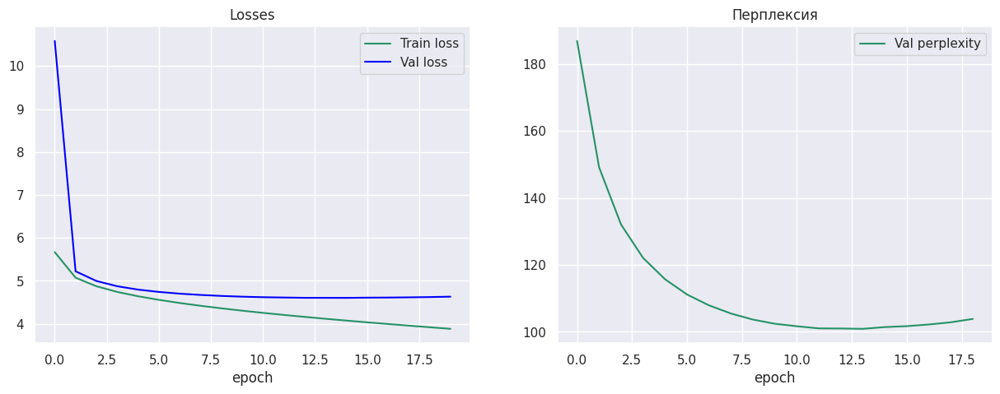

In [61]:
#теперь один слой ЛСТМ и хидден дим 512
my_results_df.loc[len(my_results_df)], lstm_model2 = train_model('LSTM', train_dataloader, num_epoch= 20, n_layers=1, hid_dim=512)
my_results_df.to_csv('my_results_df.csv')
torch.cuda.empty_cache()

Starting training for LSTM_1layers_15epohs_nelin_Tanh()_dropout0.1
LSTM


  0%|          | 0/15 [00:00<?, ?it/s]

Лучшая перплексия для подхода 'GRU_1layers_15epohs_nelin_Tanh()_dropout0.1: 98.163


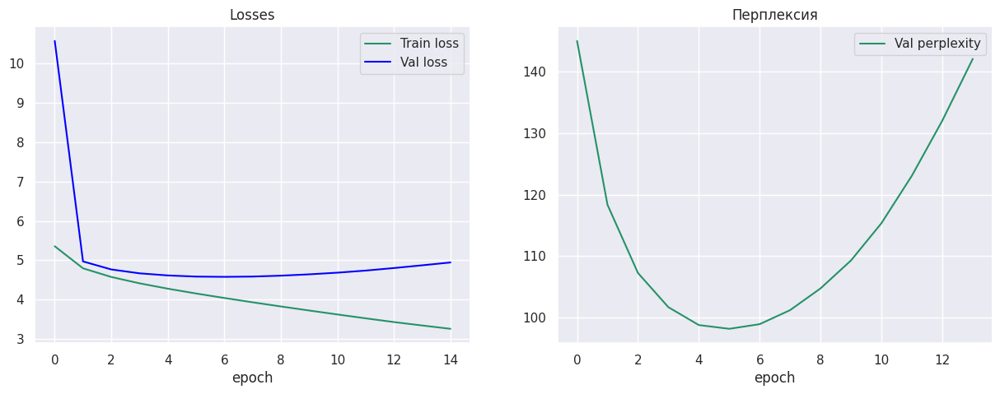

In [29]:
#Теперь попробуем ЛСТМ со скрытым слоем 1024
my_results_df.loc[len(my_results_df)], lstm_model3 = train_model('LSTM', train_dataloader, num_epoch= 15, n_layers=1, hid_dim=1024, dropout = 0.1)
my_results_df.to_csv('my_results_df.csv')
torch.cuda.empty_cache()

### Отчет (2 балла)

Опишите проведенные эксперименты. Сравните перплексии полученных моделей. Предложите идеи по улучшению качества моделей. 

In [58]:
#посмотрим на табличку с результатами
my_results_df = pd.read_csv('my_results_df.csv')
my_results_df = my_results_df.loc[:, 'Model_params':]
my_results_df


,Model_params,loss,loss_eval,perplexity,min_perplexoty,test_perpl
0,GRU_1layers_5epohs_nelin_Tanh()_dropout0.1_hid...,"[5.950466645892153, 5.331745578689024, 5.16399...","[10.591133117675781, 5.469645023345947, 5.2556...","[39780.94425579407, 239.070237968468, 193.1154...",159.967720,"(150.55396537432918, tensor(5.0070, device='cu..."
1,GRU_1layers_7epohs_nelin_Tanh()_dropout0.1_hid...,"[5.950466645892153, 5.331745578689024, 5.16399...","[10.591133117675781, 5.469645023345947, 5.2556...","[39780.94425579407, 239.070237968468, 193.1154...",144.800984,"(139.00975764776072, tensor(4.9269, device='cu..."
2,GRU_1layers_20epohs_nelin_Tanh()_dropout0.1_hi...,"[5.950466645892153, 5.331745578689024, 5.16399...","[10.591133117675781, 5.469645023345947, 5.2556...","[39780.94425579407, 239.070237968468, 193.1154...",116.061698,"(114.9486013487842, tensor(4.7362, device='cud..."
3,GRU_2layers_20epohs_nelin_Tanh()_dropout0.1_hi...,"[5.964707426225582, 5.342267691613331, 5.17320...","[10.59630012512207, 5.481372833251953, 5.26473...","[39986.634118541035, 241.8850024376959, 194.87...",115.585791,"(114.4864633902228, tensor(4.7316, device='cud..."
4,GRU_2layers_20epohs_nelin_Tanh()_dropout0.1,"[5.6103436177513615, 5.076088866912018, 4.9005...","[10.5784330368042, 5.213494300842285, 5.019551...","[39278.53494253419, 185.16922419121926, 152.60...",105.839157,"(106.08936179952418, tensor(4.6543, device='cu..."
5,GRU_2layers_10epohs_nelin_Tanh()_dropout0.1_hi...,"[5.334350237598079, 4.834268861558219, 4.63864...","[10.551445960998535, 4.9827094078063965, 4.810...","[38232.776488886775, 147.11993127608372, 123.9...",104.448393,"(106.25791703893783, tensor(4.6559, device='cu..."
6,GRU_2layers_7epohs_nelin_Tanh()_dropout0.0_hid...,"[5.312802216708547, 4.80978551231741, 4.608907...","[10.550552368164062, 4.963356971740723, 4.7834...","[38199.054913088905, 144.1878164459507, 120.50...",99.625842,"(99.0293736791176, tensor(4.5870, device='cuda..."
7,GRU_2layers_7epohs_nelin_Tanh()_dropout0.2_hid...,"[5.3608217358996955, 4.862797322630294, 4.6720...","[10.55237865447998, 5.057547092437744, 4.89686...","[38268.667090140574, 158.731870494715, 135.271...",118.217421,"(117.96207110280324, tensor(4.7594, device='cu..."
8,GRU_3layers_10epohs_nelin_Tanh()_dropout0.1_hi...,"[6.050803543179264, 5.379498511292281, 5.20161...","[10.590319633483887, 5.536746501922607, 5.3049...","[39748.04218512538, 255.68233645360883, 202.92...",136.044986,"(133.35152486319961, tensor(4.8849, device='cu..."
9,LSTM_1layers_20epohs_nelin_Tanh()_dropout0.1_h...,"[6.020428906371502, 5.356208595201934, 5.16306...","[10.59106159210205, 5.51129674911499, 5.250200...","[39777.68577840045, 249.194522660554, 192.0586...",106.931908,"(106.5823974609375, tensor(4.6608, device='cud..."


`теперь визуализируем содержимое этой таблицы`

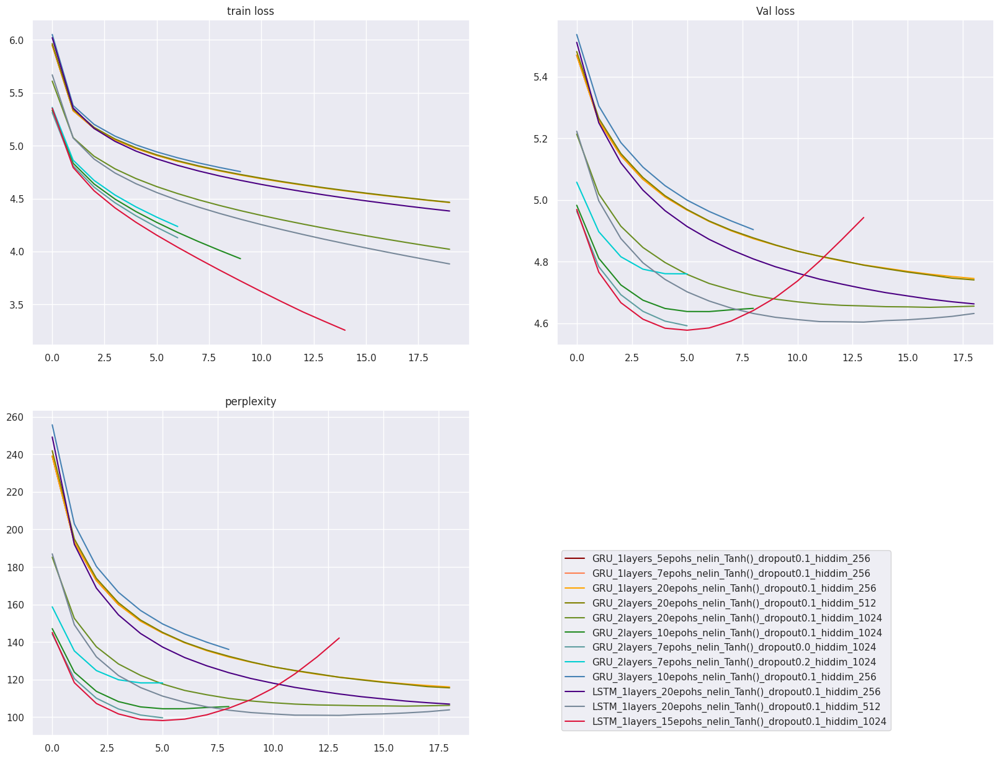

In [106]:
#так как пару раз падало ядро, часть данных прочтеа из записанного файла (по этому тип стринг, я преобразую в лист)
# так как первые значения лосаа на валидации и перплексии очень большие, для того чтобы можно было видеть дальнейшее изменение
# я отрезала первое значение
plt.figure(figsize = (20, 15))
names = []
colors = ['#8B0000', '#FF7F50', '#FFA500', '#808000', '#6B8E23', '#228B22', '#5F9EA0', '#00CED1', '#4682B4', '#4B0082', '#778899', '#DC143C']
for i in range(len(my_results_df)):
    name = my_results_df.loc[i, 'Model_params']
    if type(my_results_df.loc[i, 'loss']) is str:
        losses = [float(x) for x in my_results_df.loc[i, 'loss'][1:-1].split(',')]
    else:
        losses = my_results_df.loc[i, 'loss']
    plt.subplot(221)
    plt.plot(np.arange(len(losses)), losses, c = colors[i])
    names.append(name)
    plt.title('train loss')

for i in range(len(my_results_df)):
    name = my_results_df.loc[i, 'Model_params']
    if type(my_results_df.loc[i, 'loss_eval']) is str:
        loss_eval = [float(x) for x in my_results_df.loc[i, 'loss_eval'][1:-1].split(',')][1:]
    else:
        loss_eval = my_results_df.loc[i, 'loss_eval'][1:]
    plt.subplot(222)
    plt.plot(np.arange(len(loss_eval)), loss_eval,  c = colors[i])
    names.append(name)
    plt.title('Val loss')

for i in range(len(my_results_df)):
    name = my_results_df.loc[i, 'Model_params']
    if type(my_results_df.loc[i, 'perplexity']) is str:
        perplexity = [float(x) for x in my_results_df.loc[i, 'perplexity'][1:-1].split(',')][1:]
    else:
        perplexity = my_results_df.loc[i, 'perplexity'][1:]
    plt.subplot(223)
    plt.plot(np.arange(len(perplexity)), perplexity,  c = colors[i])
    names.append(name)
    plt.title('perplexity')
plt.legend(names, loc = 3, bbox_to_anchor=(1.2, 0));

### ВЫВОДЫ 1

видно что лучший показатель модели и 1 слоем ЛСТМ с дропаутом 0.1, размером скрытого слоя 1024, однако надо было остановить эту модель на 6 эпохах (так как значение первой эпохи я обрезала, а лучшее значениее перплексии на цифре 5, получается нужно было остановиться на 6 эпохах) (или попробовать использовать шедулер для уменьшения лернинг рейта)


-так же хороший показатель получился у модели с 2 слоями ГРУ, дропаутом 0.1 и скрытым слоем 1024

-в целом видно что при увеличении хидден дим, модель выдает лучшие показатели

-так же можно сделать вывод что модели с одним слоем дают лучшие показатели перплексии, чем модели с 2 и 3 слоями

дропаут 0,2 дал значения хуже чем модели с дропаутом 0,1
не плохой показатель у модели с дропаутом 0, но опытным путем доказано что с данной задачей/датасетом и архитектурами перплексия у моделей с дропаутом 0,1 имеет хорошие показатели

- так же видно что на тесте значения перплексии практически такие же как на валидационной выборке


лучший минимум перплексии и на Валидации и на Тесте *0,99*

Starting training for GRU_2layers_20epohs_nelin_Tanh()_dropout0.0
GRU


  0%|          | 0/20 [00:00<?, ?it/s]

early break at 9
Лучшая перплексия для подхода 'GRU_2layers_20epohs_nelin_Tanh()_dropout0.0: 99.989


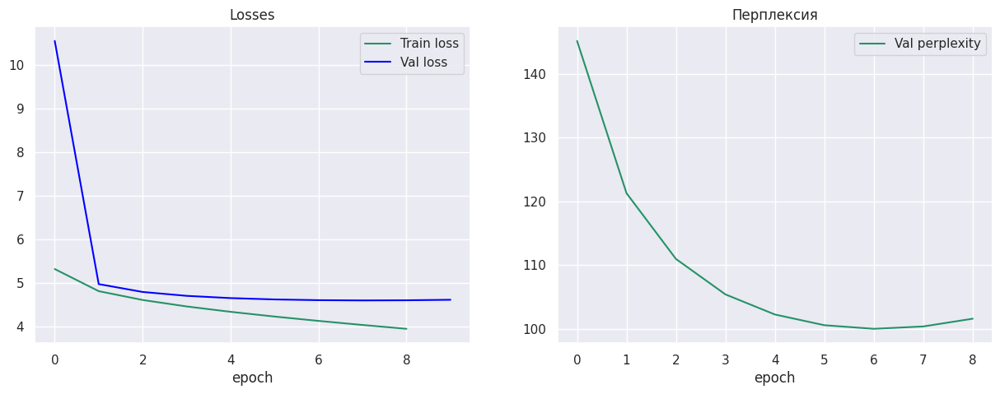

In [114]:
#последний эксперимент. Я дописала возможность раннего прерывания обучения модели при условии че в течение 2 эпох значение перплексии ухудшается и зпустила обучение на большее количество эпох
my_results_df.loc[len(my_results_df)], gru_model4 = train_model('GRU', train_dataloader, num_epoch= 20, n_layers=2, hid_dim=1024, dropout = 0.0)
my_results_df.to_csv('my_results_df.csv')
torch.cuda.empty_cache()

Видно что после 7 эпохи опять начинается переобучение 
все-таки посмотрим что выдает эта модель

In [115]:
def generate_sequence(model, starting_seq: str, max_seq_len: int = 128) -> str:
    device = 'cpu'
    model = model.to(device)
    input_ids = [word2ind['<bos>']] + [
        word2ind.get(word, word2ind['<unk>']) for word in word_tokenize(starting_seq, language='english') if word not in string.punctuation]
    input_ids = torch.LongTensor(input_ids).to(device)
    
    model.eval()
    with torch.no_grad():
        for i in range(max_seq_len):
            next_char_distribution = model(input_ids)[-1]
            next_char = next_char_distribution.squeeze().argmax()
            input_ids = torch.cat([input_ids, next_char.unsqueeze(0)])

            if next_char.item() == word2ind['<eos>']:
                break
    
    words = ' '.join([ind2word[idx.item()] for idx in input_ids])

    return words

In [116]:
generate_sequence(gru_model4, starting_seq='that is, in a philosophical sense, what fay grim is ')

'<bos> that is in a philosophical sense what fay grim is the fact that the characters are <unk> <eos>'

In [121]:
generate_sequence(gru_model4, starting_seq='all are transformed at the end of the')

'<bos> all are transformed at the end of the movie <unk> <eos>'

In [122]:
generate_sequence(gru_model4, starting_seq="so all in all it's a waste of your")

"<bos> so all in all it 's a waste of your time <unk> <eos>"

In [ ]:
test_sentences[:10]

['that is, in a philosophical sense, what fay grim is all about.',
 'the characters are simply too forced and stereotypes are pushed too far.',
 'his fannish gore predilections also see a hand severing.',
 'from the accent to her belting out "adelaide\'s lament", she\'s just terrific.',
 'this version is not recommended for classroom use, or much else.',
 'all are transformed at the end of the movie.',
 'who are these "they"- the actors?',
 "so all in all it's a waste of your life.",
 "'not one of us, brit and american alike forget what goes around comes around.",
 'i fancy to see this again.']

### ВЫВОДЫ 2
для улучшения модели можно попробовать использовать шедулер (для постепенного уменьшения размера шага)

думаю так же надо было просто убрать все знаки припинания до разделения на токены с самого начала

так же можно попробовать поставить батчнорм


лучшее значение перплексии *99*